## Investigate the effect of spike detection

In [2]:
%reload_ext autoreload
%autoreload 2
%load_ext rpy2.ipython

from online_sorter_qtui import spike_data
from pyneurode.spike_sorter import *
import numpy as np 
import pickle
from sklearn import metrics
from tqdm.notebook import tqdm
import seaborn as sns

import spikeinterface.extractors as se
import spikeinterface.toolkit as st
import spikeinterface.sorters as ss
import spikeinterface.comparison as sc
import spikeinterface.widgets as sw

from sklearn import *

from palettable.colorbrewer.qualitative import Dark2_4 as p4color

from utils import *

from time import sleep

%R require(ggplot2)
%R require(repr)

C:\Users\teristam\Anaconda3\envs\oeEnv\lib\site-packages\rpy2\robjects\packages.py:366: UserWarning: The symbol 'quartz' is not in this R namespace/package.
  "The symbol '%s' is not in this R namespace/package." % name
C:\Users\teristam\Anaconda3\envs\oeEnv\lib\importlib\_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)
C:\Users\teristam\Anaconda3\envs\oeEnv\lib\importlib\_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)
C:\Users\teristam\Anaconda3\envs\oeEnv\lib\importlib\_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)
R[write to console]: Loading required package: ggplot2

R[write to console]: Loading required packa

array([1], dtype=int32)

In [2]:
# load data
data_list = loadPackets('data/data_packets_M2_D23_3.pkl')
data_list = [d for d in data_list if d]

Reached end. Total segment: 126868


In [3]:
Fs = 30000
spikes_data = [d['spike'] for d in data_list if 'spike' in d.keys()]
df_spikes = makeSpikeDataframe(spikes_data)
df_spikes.sort_values('timestamps',inplace=True)
print(len(df_spikes))
df_spikes.head()


111089


,spike_waveform,time,electrode_ids,channel_ids,spike_id,timestamps
0,"[-5.7485013, -5.5810714, -11.215428, -16.83687...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",2,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",0,10081
1,"[-27.44911, -39.954662, -38.020676, -28.24411,...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",1,10197
2,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",3,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",2,10365
3,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",3,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",3,10409
4,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",3,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",4,10439


(27, 9413760)
8960


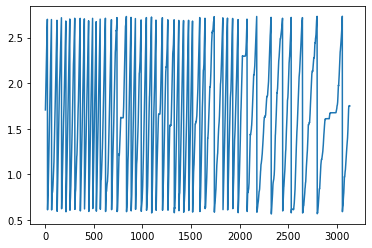

In [4]:
# collect the animal position
time_bin = 0.1
adc_data = [d['data'] for d in data_list if 'data' in d]
data_ts = [d['data_timestamp'] for d in data_list if 'data_timestamp' in d ]
adc_data = np.concatenate(adc_data,1)
print(adc_data.shape)
start_timestamp = data_ts[0]
print(start_timestamp)

# Extract and time-bin the data
segment_size = int(Fs*time_bin)
position, _ = simpleDownSample(adc_data[20,:,None], segment_size)
plt.plot(position)

neuroData = adc_data[:16,:]


In [3]:
preSample = postSample = 20

spikes_list = detectSpike(neuroData,3)
print(len(spikes_list))
print(spikes_list[0])

NameError: name 'neuroData_w' is not defined

In [7]:
df = makeSpikeDataframe(spikes_list)
df = df.sort_values('timestamps').reset_index()
df

,index,spike_waveform,time,electrode_ids,channel_ids,spike_id,timestamps
0,181043,"[5.3035336, -3.4177158, -8.443727, -4.7834344,...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",3,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",181043,22
1,181044,"[5.8765187, 9.31958, 14.370857, 17.718203, 16....","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",3,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",181044,64
2,137546,"[21.967031, 20.638983, 18.9655, 17.695621, 16....","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",2,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",137546,68
3,70791,"[18.408236, 8.1900215, 0.20906591, -3.9675074,...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",1,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",70791,127
4,70792,"[-3.4367955, 7.693555, 15.513073, 14.343949, 9...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",1,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",70792,215
...,...,...,...,...,...,...,...
259897,137545,"[-32.41636, -36.10121, -37.879883, -40.027752,...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",1,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",137545,9413508
259898,70789,"[1.7184987, 22.433226, 43.50724, 59.763187, 66...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",70789,9413511
259899,259900,"[-5.2719064, -18.298006, -29.274164, -21.39500...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",3,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",259900,9413529
259900,259901,"[-12.7764635, -6.381998, -4.5917687, -5.610086...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",3,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",259901,9413617


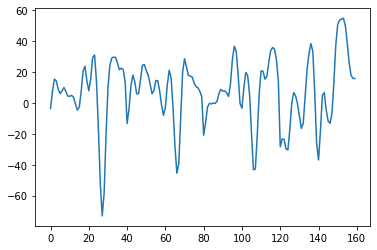

In [16]:
plt.plot(df.iloc[1].spike_waveform)

In [17]:
# sort the spikes
num2sort = 2000
df_ref, df_online,template_cluster_id = sort_spikes_online(df.iloc[:num2sort], df)

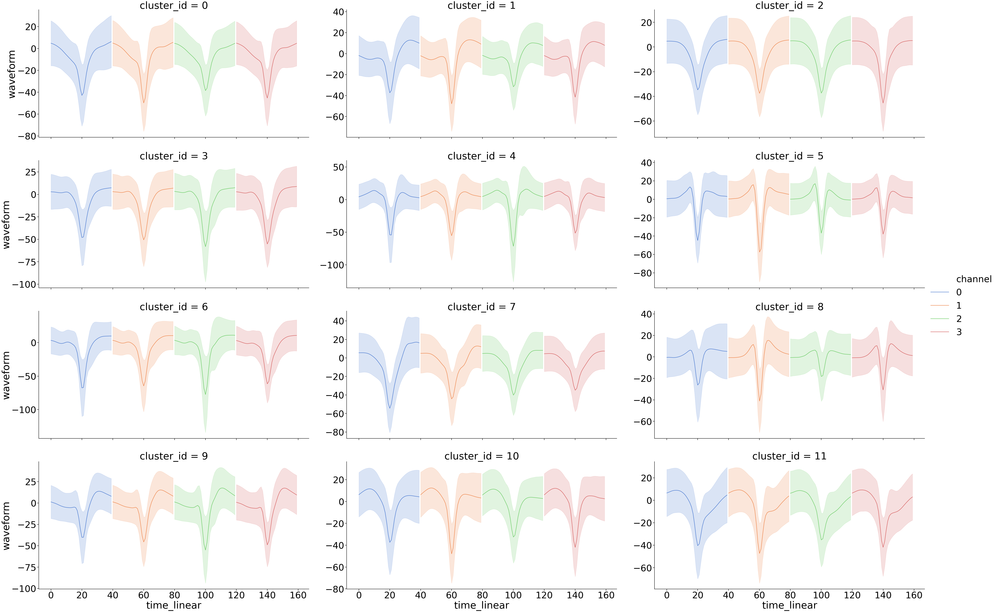

In [18]:
# plot spike waveform
clusters = df_online.label_tm.unique()

waveforms = []

for c in clusters:
    spiketime = df_online[df_online.label_tm==c].timestamps
    electrode = df_online[df_online.label_tm==c].electrode_ids.values
    waveform = getSpikeWaveform(spiketime,electrode[0],neuroData)
    waveforms.append(waveform)
    
df_waveforms_median = spikeWaveform2DF(waveforms)

sns.set_context('talk',font_scale=3)
sns.relplot(y='waveform',x ='time_linear', hue='channel', col='cluster_id',
            col_wrap=3, height=12, aspect=2,
            kind='line',ci='sd',facet_kws={'sharey':False},palette='muted',data=df_waveforms_median)

(12, 3137)


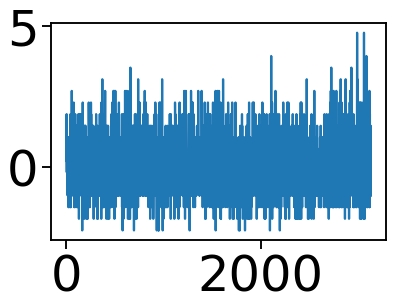

In [19]:
# make firing rate array
Fs = 30000
time_bin = 0.1
time_bin_start=0
spike_time = (df_online.timestamps.values)/Fs #shift timestamp
bins = np.arange(time_bin_start, spike_time.max(), time_bin )
spk_train, skp_time_event=sort2spiketrain(template_cluster_id, df_online.label_tm, spike_time, bins)
print(spk_train.shape)

#normalize the firing rate
scaler =preprocessing.StandardScaler()
norm_spiketrain = scaler.fit_transform(spk_train.T)
plt.plot(norm_spiketrain[:,0])

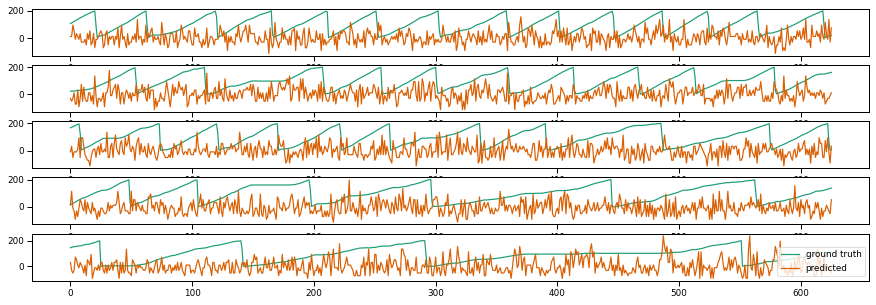

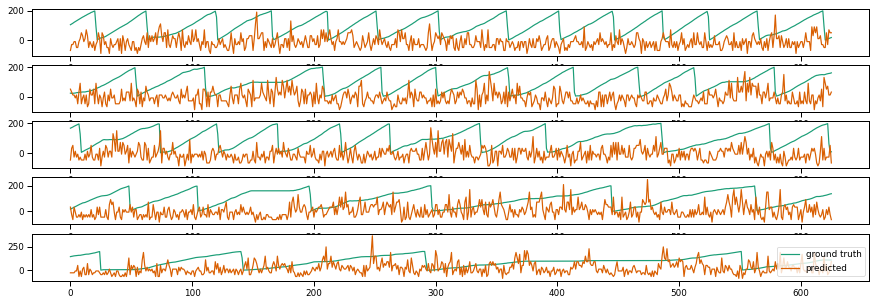

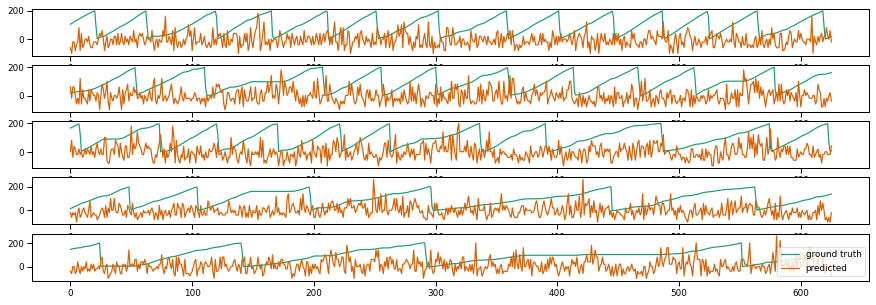

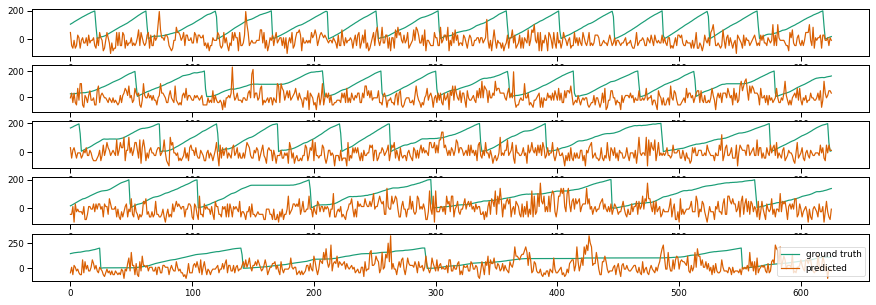

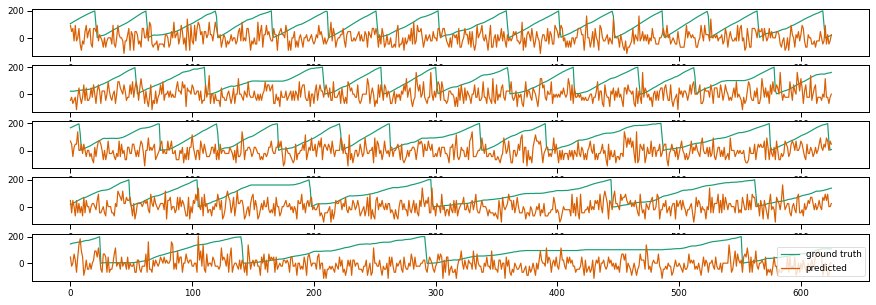

...

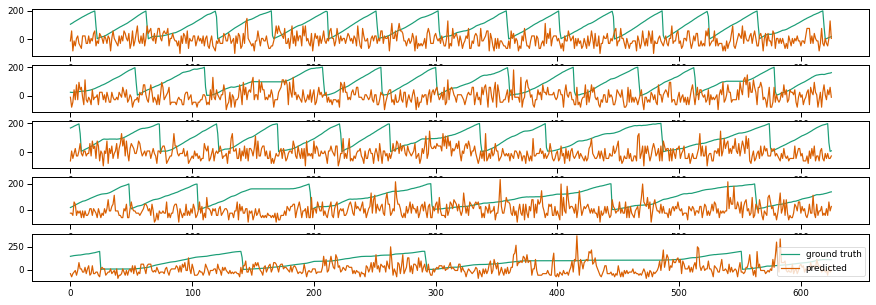

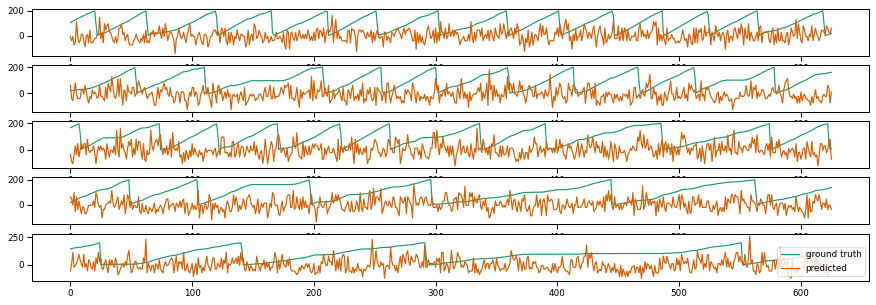

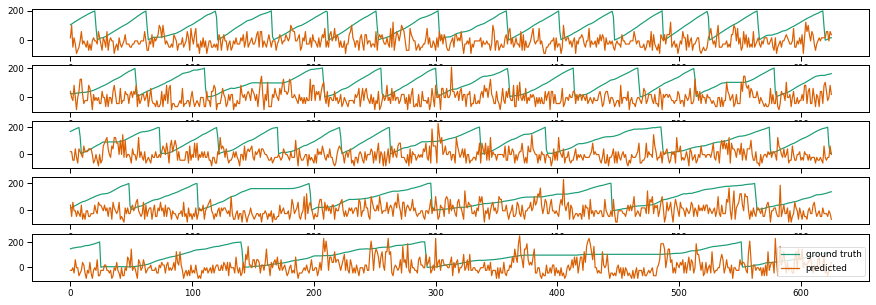

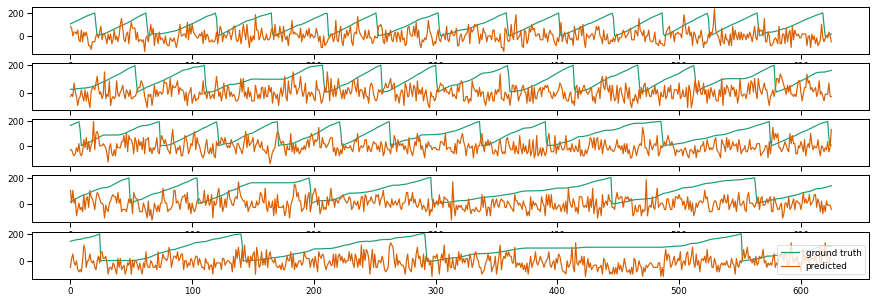

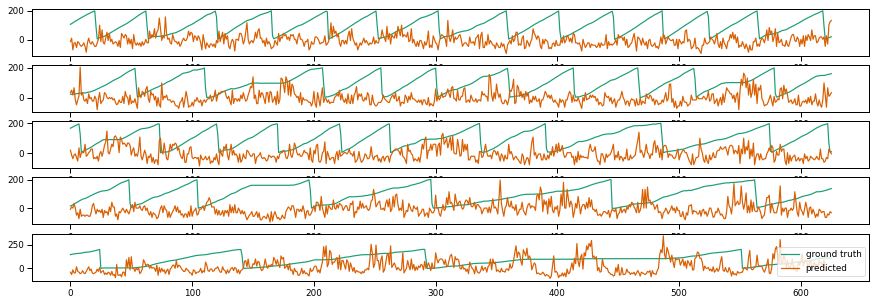

In [20]:
sns.set_context('paper')

for i in range(norm_spiketrain.shape[1]):
    stripplot(norm_pos_online,norm_spiketrain[:,i]*50);

### Train decoder

In [21]:
norm_pos_online = position 

data_length = min(norm_spiketrain.shape[0], norm_pos_online.shape[0])
norm_spiketrain = norm_spiketrain[:data_length,:]
norm_pos_online = norm_pos_online[:data_length]

norm_pos_online = np.round((norm_pos_online-norm_pos_online.min())/(norm_pos_online.max()-norm_pos_online.min())*200)


In [22]:
polyFeatures = preprocessing.PolynomialFeatures(2).fit(norm_spiketrain)
poly_spiketrain = polyFeatures.transform(norm_spiketrain)
lasso = linear_model.Lasso(alpha=0.1).fit(poly_spiketrain,norm_pos_online)
featureName = np.array(polyFeatures.get_feature_names())
idx = np.argsort(-lasso.coef_**2) #sorted feature index, descending
sortedFeatureName = featureName[idx]
print(sortedFeatureName)

['x11' 'x3' 'x1' 'x10' 'x2' 'x0' 'x4' 'x8 x11' 'x1 x8' 'x4 x10' 'x3 x11'
 'x5 x7' 'x2 x6' 'x0 x2' 'x6 x10' 'x4 x5' 'x9' 'x0^2' 'x0 x1' 'x8 x9'
 'x0 x5' 'x0 x6' 'x0 x4' 'x0 x3' 'x9 x10' 'x3 x5' 'x1 x3' 'x8' 'x10 x11'
 'x2 x11' 'x3 x10' 'x5' 'x7^2' 'x3^2' 'x2^2' 'x2 x8' 'x5 x10' 'x7 x9'
 'x2 x9' 'x2 x10' 'x0 x10' 'x4 x11' 'x1 x10' 'x9 x11' 'x0 x7' 'x4^2' 'x6'
 'x3 x9' 'x4 x9' 'x2 x7' 'x4 x7' 'x0 x8' 'x8 x10' 'x7' 'x1 x9' 'x1^2'
 'x11^2' 'x2 x5' 'x8^2' 'x9^2' 'x3 x6' 'x3 x7' 'x1 x2' 'x5 x9' 'x1 x4'
 'x6^2' 'x6 x9' 'x4 x8' 'x1 x7' 'x5^2' 'x3 x8' 'x1 x6' 'x0 x9' 'x2 x4'
 'x5 x11' 'x3 x4' 'x0 x11' 'x10^2' 'x1 x5' 'x7 x11' 'x4 x6' 'x7 x8'
 'x6 x11' 'x1 x11' 'x6 x8' 'x6 x7' 'x2 x3' 'x5 x8' 'x5 x6' 'x7 x10' '1']


[[1.       0.265921]
 [0.265921 1.      ]]


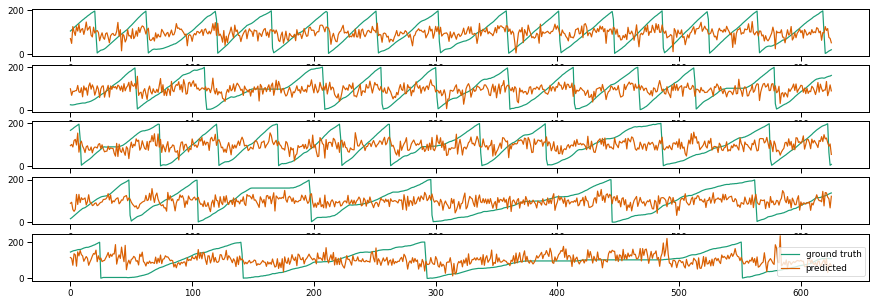

In [23]:
predicted = model_selection.cross_val_predict(lasso,poly_spiketrain,norm_pos_online,cv=5)
bestCoeff = np.corrcoef(norm_pos_online.squeeze(),predicted)
print(bestCoeff)
stripplot(norm_pos_online,predicted);

### use mountainsort for decoding

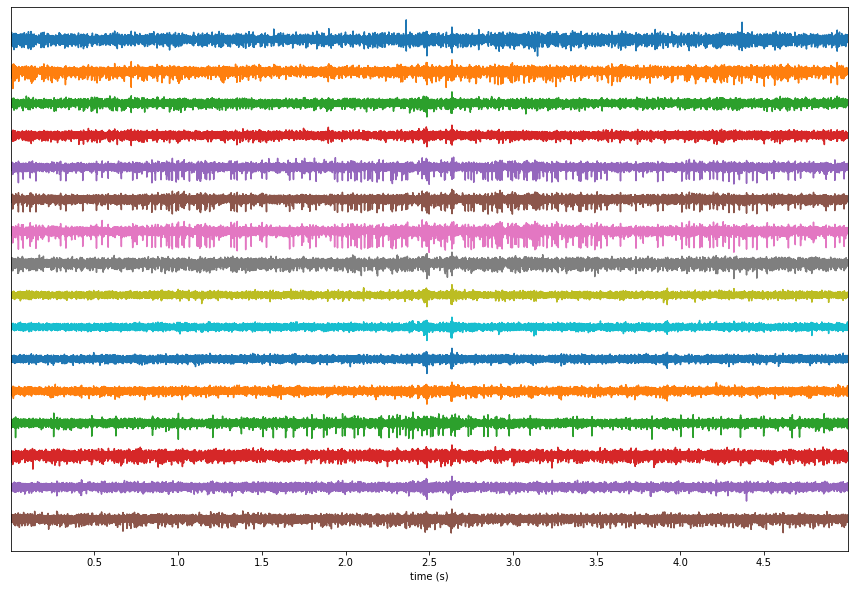

In [26]:
neuroData = adc_data[:16,:]
recording = se.NumpyRecordingExtractor(timeseries=neuroData,sampling_frequency=Fs)
recording.load_probe_file('tetrode_16.prb')
recording_f = st.preprocessing.bandpass_filter(recording, freq_min=300, freq_max=6000)
fig,ax = plt.subplots(figsize=(15,10))
sw.plot_timeseries(recording_f,trange=[0,5],ax=ax);

In [27]:
# sorting
%env TEMPDIR=C:\tmp
ms4_params = ss.get_default_params('mountainsort4')
ms4_params['curation']=True
ms4_params['adjust_radius']  = 100
sorting_MS4_2 = ss.run_mountainsort4(recording=recording,output_folder='sorting_tmp',verbose=True)

env: TEMPDIR=C:\tmp
WARNING! No channel location given. Add dummy location.
Using 2 workers.
Using tmpdir: C:\tmp\tmpy4klyzrl
Num. workers = 2
Preparing C:\tmp\tmpy4klyzrl/timeseries.hdf5...
'end_frame' set to 9413760
Preparing neighborhood sorters (M=16, N=9413760)...
Preparing output...
Done with ms4alg.
Cleaning tmpdir::::: C:\tmp\tmpy4klyzrl
mountainsort4 run time 103.85s


In [29]:
# curation
sorting_ms4_curated = st.curation.threshold_snrs(sorting=sorting_MS4_2, recording = recording,
  threshold = 4, threshold_sign='less',
    max_snr_spikes_per_unit=100, apply_filter=False) #remove when less than threshold
print(sorting_ms4_curated.get_unit_ids())

sorting_ms4_curated=st.curation.threshold_firing_rates(sorting_ms4_curated,
    threshold=0.5, threshold_sign='less', duration_in_frames=recording.get_num_frames())
print(sorting_ms4_curated.get_unit_ids())

sorting_ms4_curated=st.curation.threshold_isi_violations(sorting_ms4_curated, 
    threshold = 0.9,duration_in_frames=recording.get_num_frames(), threshold_sign='greater' )
print(sorting_ms4_curated.get_unit_ids())

[3, 5, 6, 9, 10, 16, 17, 27, 30, 31]
[3, 5, 6, 9, 10, 16, 17, 27, 30, 31]
[3, 5, 6, 9, 10, 16, 17, 27, 30, 31]


In [41]:
st.postprocessing.get_unit_max_channels(recording, sorting_ms4_curated, save_as_property=True)


[1, 1, 2, 3, 3, 6, 6, 11, 12, 12]

### Compare spike detection between mountainsort and median

In [33]:
# compare the spike detected in mounsort and median method
spiketime_ms4 = []
for i in sorting_ms4_curated.get_unit_ids():
    spiketime_ms4.append(sorting_ms4_curated.get_unit_spike_train(i))
spiketime_ms4 = np.sort(np.concatenate(spiketime_ms4))
spiketime_median = df.timestamps.values

#sync the spike time with data
df_spikes_sync = syncSpikeTime(df_spikes,neuroData,spikeIdx=0,searchLength=10000)
spiketime_online = np.sort(df_spikes_sync.timestamps.values)

Match found at 462


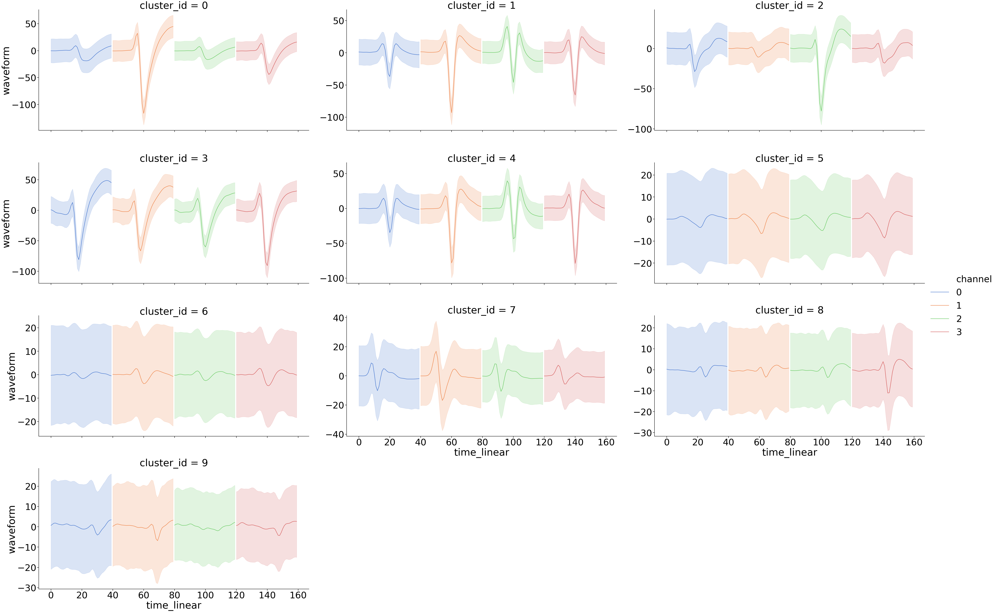

In [110]:
# plot the spike waveform

## Mountainsort
waveforms = []

for i in sorting_ms4_curated.get_unit_ids():
    spiketime = sorting_ms4_curated.get_unit_spike_train(i)
    max_channel = sorting_ms4_curated.get_unit_property(i,'max_channel')
    spikes = getSpikeWaveform(spiketime,max_channel//16,neuroData)
    waveforms.append(spikes)

df_waveforms = spikeWaveform2DF(waveforms)

sns.set_context('talk',font_scale=3)
sns.relplot(y='waveform',x ='time_linear', hue='channel', col='cluster_id',
            col_wrap=3, height=12, aspect=2,
            kind='line',ci='sd',facet_kws={'sharey':False},palette='muted',data=df_waveform)

plt.savefig('figures/mountainsort_waveform.png')

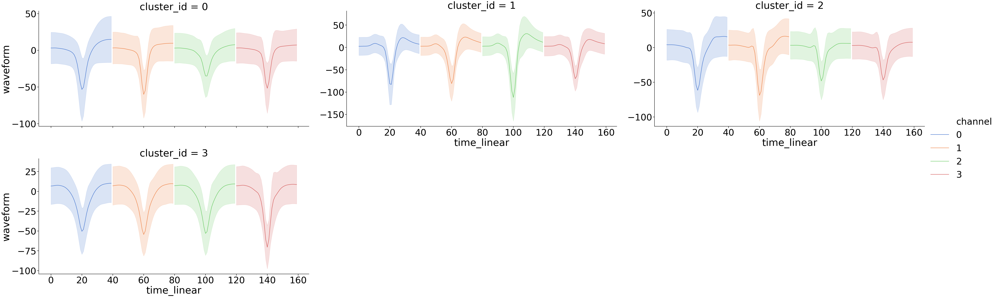

In [118]:
# offline spike detection
clusters = df_online.label_tm.unique()

waveforms = []

for c in clusters:
    spiketime = df_online[df_online.label_tm==c].timestamps
    electrode = df_online[df_online.label_tm==c].electrode_ids.values
    waveform = getSpikeWaveform(spiketime,electrode[0],neuroData)
    waveforms.append(waveform)
    
df_waveforms_median = spikeWaveform2DF(waveforms)

sns.set_context('talk',font_scale=3)
sns.relplot(y='waveform',x ='time_linear', hue='channel', col='cluster_id',
            col_wrap=3, height=12, aspect=2,
            kind='line',ci='sd',facet_kws={'sharey':False},palette='muted',data=df_waveforms_median)

plt.savefig('figures/median_spikedetect_waveform.png')

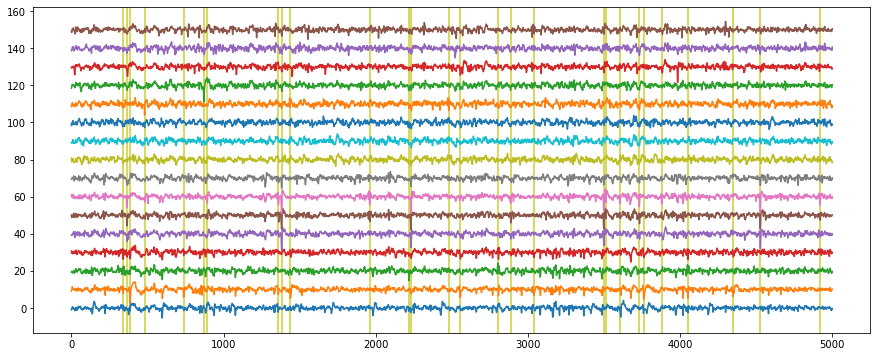

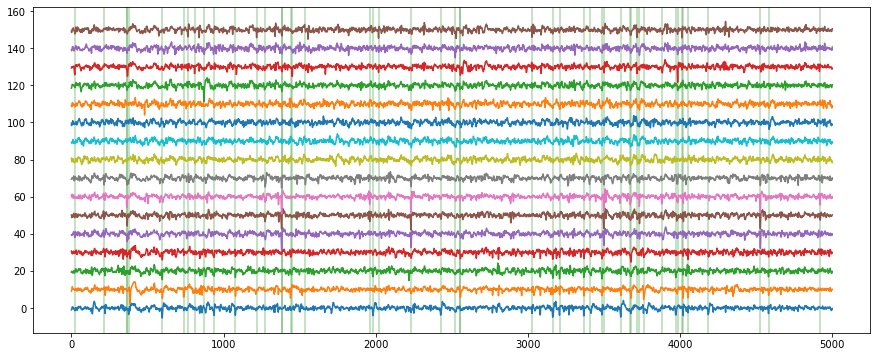

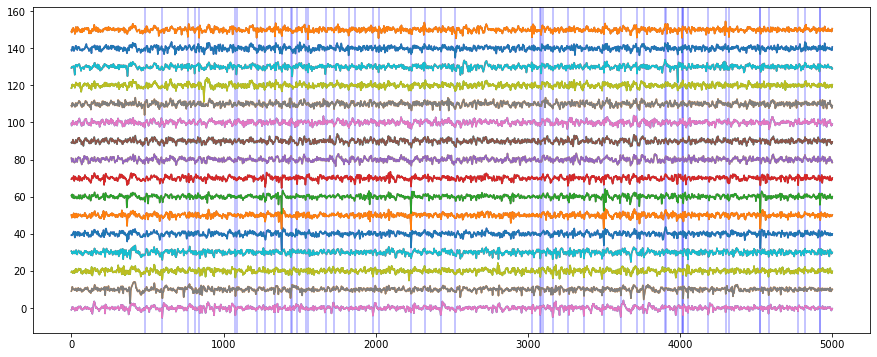

In [39]:
plot_range = 5000

plot_spikeEvent(neuroData,spiketime_ms4,plot_range,color='y',alpha=0.8)
plot_spikeEvent(neuroData,spiketime_median,plot_range,color='g',alpha=0.3)
plot_spikeEvent(neuroData,spiketime_online,plot_range,color='b',alpha=0.3)


plot_multichannel(neuroData[:,:plot_range],10)

In [248]:
data_list2 = loadPackets('data/data_packets_M2_D23_3.pkl')
adc_data2 = [d['data'] for d in data_list2 if 'data' in d]
spikes2 = [d['spike'] for d in data_list2 if 'spike' in d]
spiketimes2 = np.array([s.timestamp for s in spikes2])
adc_data2 = np.concatenate(adc_data2,1)
neurodata2 = adc_data2[:16,:]
plt.figure(figsize=(18,12))
# plot_multichannel(adc_data2[:16,:plot_range],10)

from ipywidgets import interact, interactive, fixed, interact_manual
from ipywidgets import widgets

@interact(x=widgets.IntSlider(min=-3000, max=3000, step=1, value=0))
def shift_plot(x):
    plot_spikeEvent(adc_data2[:16,:],spiketimes2-x,1000,color='y')


Reached end. Total segment: 773


<Figure size 1296x864 with 0 Axes>

interactive(children=(IntSlider(value=0, description='x', max=3000, min=-3000), Output()), _dom_classes=('widg…

161


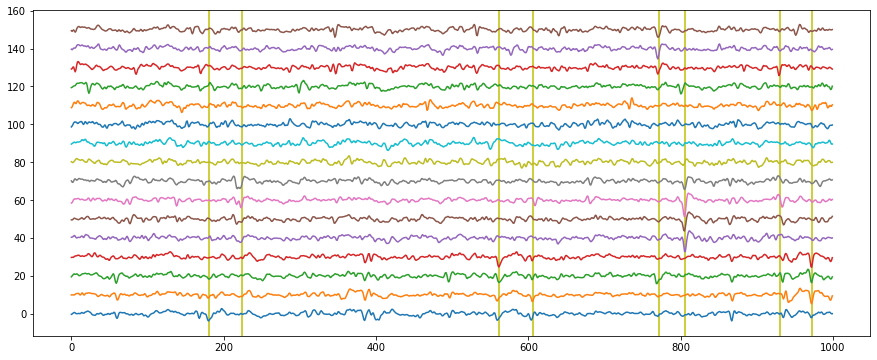

In [281]:
# match the timestamp of the data and spike

def findMatch(y,x):
    #match position of x in y
    for j in range(4):
        for i in range(y.shape[1]-x.shape[1]):
            if np.allclose(y[j:j+4,i:i+x.shape[1]],x):
                return i
          
first_spike_data = spikes2[0].data
match_idx = findMatch(neurodata2,first_spike_data)
first_spike_time = spikes2[0].timestamp

spike_time_sync = spiketimes2-first_spike_time+match_idx+first_spike_data.shape[1]/2

print(match_idx)

plot_spikeEvent(adc_data2[:16,:],spike_time_sync,1000,color='y')

{'n_channels': 4, 'n_samples': 40, 'electrode_id': 0, 'sorted_id': 0, 'timestamp': 1460, 'channel': 0, 'threshold': 5, 'source': 106}


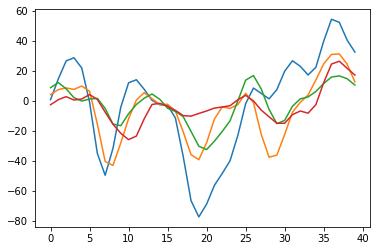

In [245]:
print(spikes2[0])
plt.plot(spikes2[0].data.T);



In [256]:
# try to search for the matching spikes
x = spikes2[0].data
y=neurodata2[:,:5000]

def findMatch(y,x):
    #match position of x in y
    for j in range(4):
        for i in range(y.shape[1]-x.shape[1]):
            if np.allclose(y[j:j+4,i:i+x.shape[1]],x):
                return i


# np.correlate(y,x)
# plt.plot(np.correlate(y,x))
# plt.xlim([0,5000])

In [258]:
%timeit findMatch(y,x)

4.47 ms ± 89.4 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [169]:
spikes2[:5]

[{'n_channels': 4, 'n_samples': 40, 'electrode_id': 1, 'sorted_id': 0, 'timestamp': 2, 'channel': 0, 'threshold': 5, 'source': 106} Spike data shape:(4, 40),
 {'n_channels': 4, 'n_samples': 40, 'electrode_id': 0, 'sorted_id': 0, 'timestamp': 4, 'channel': 0, 'threshold': 5, 'source': 106} Spike data shape:(4, 40),
 {'n_channels': 4, 'n_samples': 40, 'electrode_id': 1, 'sorted_id': 0, 'timestamp': 116, 'channel': 0, 'threshold': 5, 'source': 106} Spike data shape:(4, 40),
 {'n_channels': 4, 'n_samples': 40, 'electrode_id': 3, 'sorted_id': 0, 'timestamp': 694, 'channel': 0, 'threshold': 5, 'source': 106} Spike data shape:(4, 40),
 {'n_channels': 4, 'n_samples': 40, 'electrode_id': 3, 'sorted_id': 0, 'timestamp': 800, 'channel': 0, 'threshold': 5, 'source': 106} Spike data shape:(4, 40)]

### Decoding

In [36]:
time_bin_start = 0
start_timestamp = 0

bins = np.arange(time_bin_start, adc_data.shape[1]/Fs, time_bin )

# extract the spike train, and bin it in time
spiketrain = []
for i in sorting_ms4_curated.get_unit_ids():
    spk_train = sorting_ms4_curated.get_unit_spike_train(i)
    spk_train = (spk_train - start_timestamp)/Fs #convert to s
    spiketrain.append(np.histogram(spk_train,bins)[0])

spiketrain_ms4=np.stack(spiketrain)   

[[1.         0.23287466]
 [0.23287466 1.        ]]


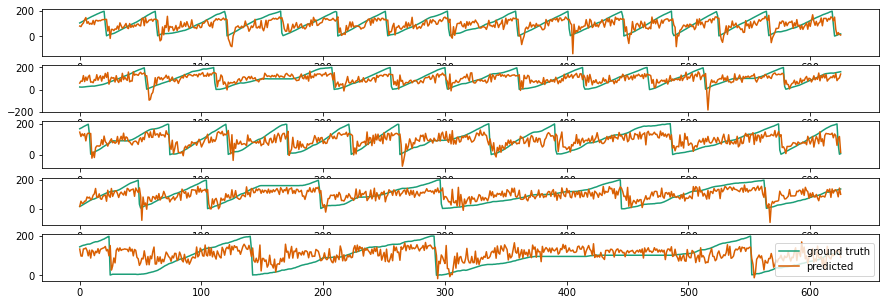

In [37]:
scaler =preprocessing.StandardScaler()
norm_spiketrain_ms4 = scaler.fit_transform(spiketrain_ms4.T)

norm_pos = np.round((position-position.min())/(position.max()-position.min())*200)

datalength = min(norm_spiketrain_ms4.shape[0], norm_pos.shape[0])
norm_spiketrain_ms4 = norm_spiketrain_ms4[:datalength,:]
norm_pos = norm_pos[:datalength]

poly_spiketrain_ms4 = preprocessing.PolynomialFeatures(2).fit_transform(norm_spiketrain_ms4)
# poly_spiketrain_ms4 = polyFeatures_ms4.transform(norm_spiketrain_ms4)
lasso_ms4 = linear_model.Lasso(alpha=0.1).fit(poly_spiketrain_ms4,norm_pos)

predicted_ms4 = model_selection.cross_val_predict(lasso_ms4,poly_spiketrain_ms4,norm_pos,cv=4)
bestCoeff_ms4 = np.corrcoef(norm_pos.squeeze(),predicted_ms4)
print(bestCoeff)

stripplot(norm_pos,predicted_ms4);

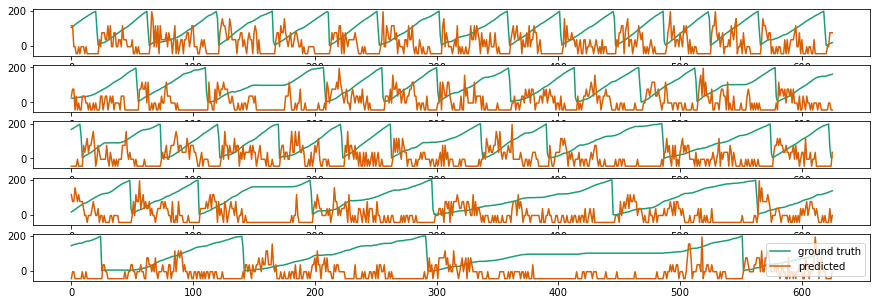

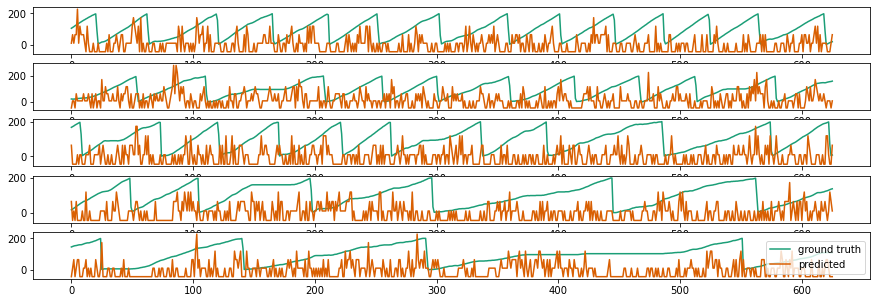

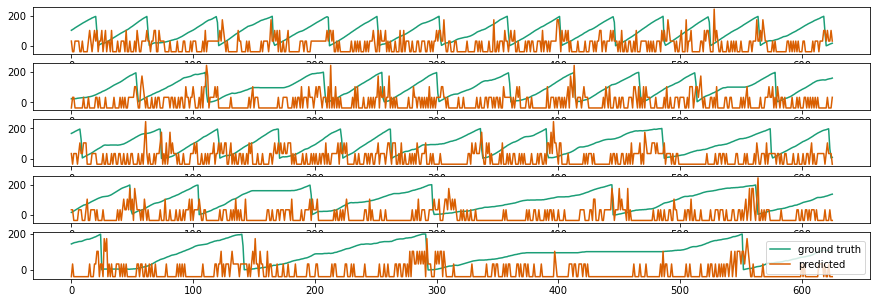

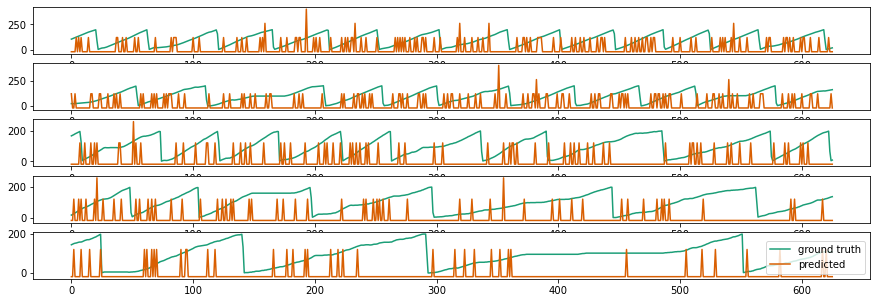

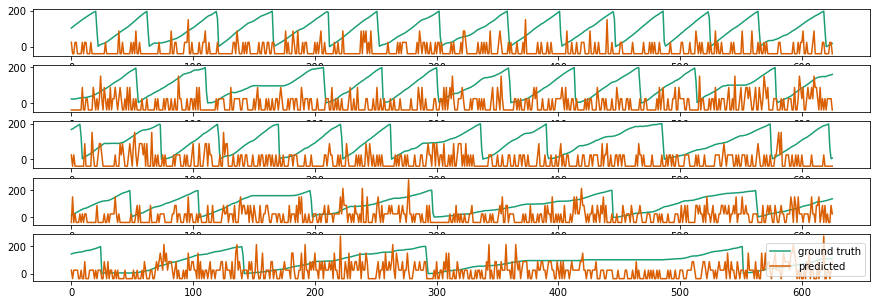

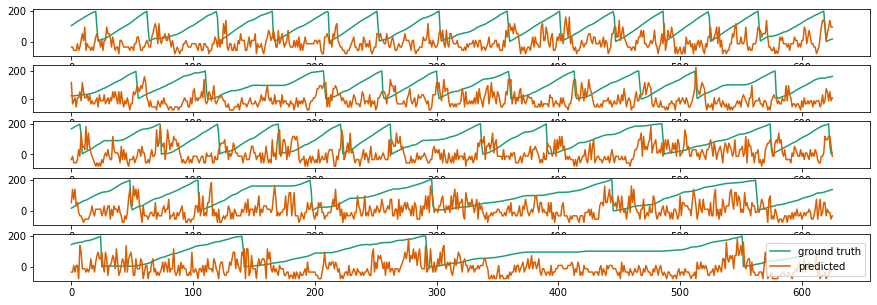

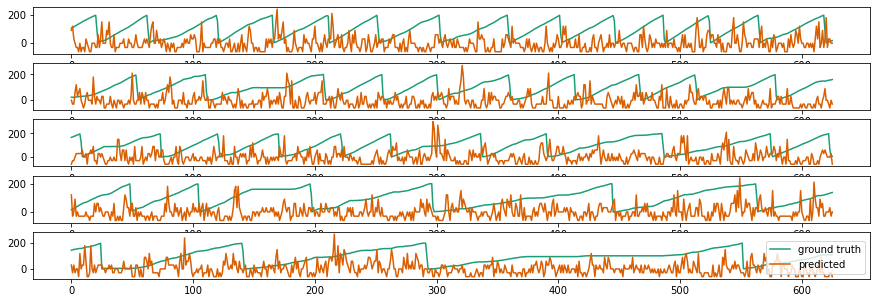

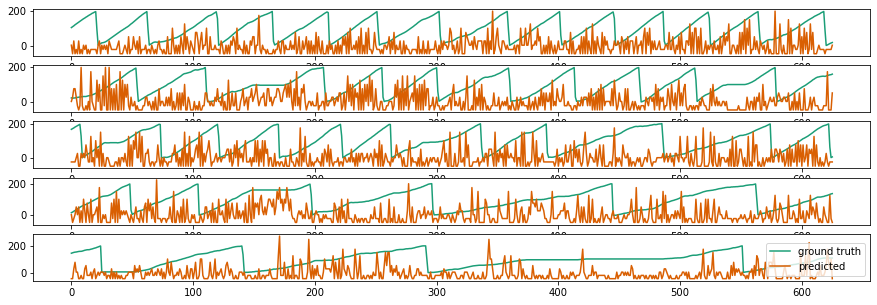

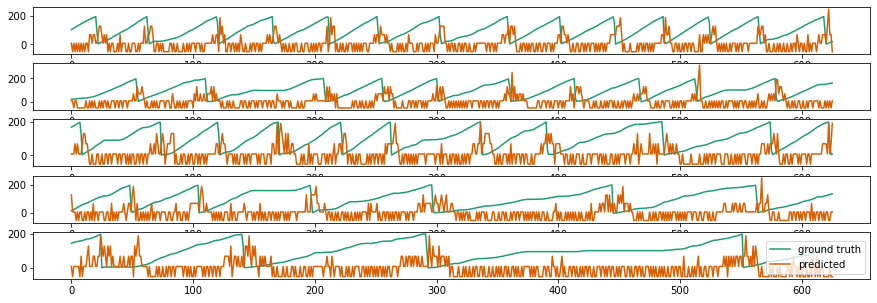

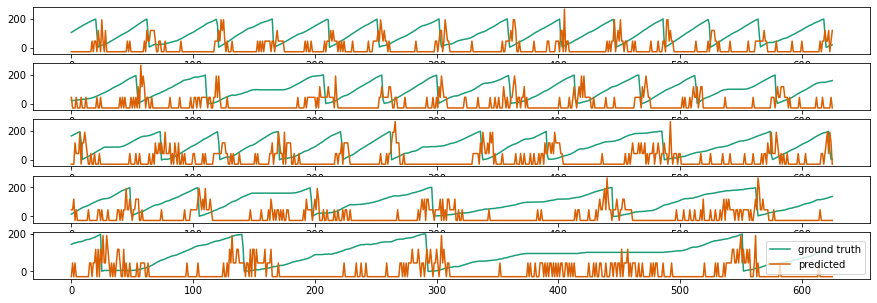

In [38]:
for i in range(norm_spiketrain_ms4.shape[1]):
    stripplot(norm_pos,norm_spiketrain_ms4[:,i]*50);

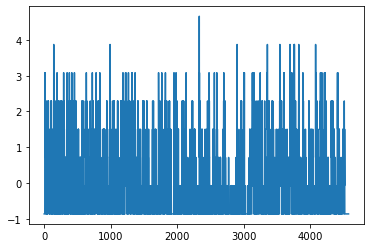

In [43]:
plt.plot(norm_spiketrain_ms4[:,2])

In [44]:
df_decoded = pd.read_pickle('data/decoded_data.pkl')

In [47]:
df_decoded.sort_values('meanScore',ascending=False)

,model,sortedFeatureName,meanScore,scores,bestNumfeature,session
112,Lasso(alpha=0.1),"[x2, x0, x3, x10, x12, x2^2, x9, x13, x15, x2 ...",0.390540,"[0.20939310126147365, 0.26086171584513046, 0.2...",66,cohort_4:M2_D23_2019-04-03_13-34-00
120,Lasso(alpha=0.1),"[x2, x14, x9, x8, x2^2, x2 x14, x3, x14^2, x9 ...",0.370806,"[0.18506497320448698, 0.18449288057857466, 0.2...",101,cohort_4:M2_D25_2019-04-05_12-44-59
97,Lasso(alpha=0.1),"[x3, x15, x16, x3^2, x3 x16, x14, x17, x19, x2...",0.334787,"[0.24008593355009583, 0.25857119736991124, 0.2...",85,cohort_4:M2_D24_2019-04-04_13-22-05
121,Lasso(alpha=0.1),"[x15, x16, x5 x15, x10, x1, x10 x14, x13 x15, ...",0.331282,"[0.11670965287913677, 0.1333439467175645, 0.16...",98,cohort_4:M2_D27_2019-04-09_13-04-27
105,Lasso(alpha=0.1),"[x8, x3, x0, x4, x0 x5, x5 x8, x8^2, x3 x8, x2...",0.293779,"[0.1996118438120077, 0.1989804616260172, 0.250...",28,cohort_4:M2_D16_2019-03-25_13-22-42
...,...,...,...,...,...,...
0,Lasso(alpha=0.1),"[x0, x0^2, 1]",-283.903591,"[-241.30446237785492, -283.90359116203456]",1,cohort_2:1124_D10_2018-10-29_11-12-49
94,Lasso(alpha=0.1),"[x5, x2, x6, x4, x1, x5 x8, x5^2, x8, x6 x8, x...",-453.546058,"[-214.41636449955573, -453.5460576483923, -470...",1,cohort_3:M1_D21_2018-10-16_11-54-11
31,Lasso(alpha=0.1),"[x4, x2, x3, x1, x5, x5^2, x1 x3, x2^2, x3 x5,...",-493.398021,"[-261.2327942672108, -493.398021304907, -772.6...",1,cohort_2:245_D3_2018-10-20_10-56-04
84,Lasso(alpha=0.1),"[x12, x7, x13, x8, x10, x7 x12, x5, x6, x11, x...",-2940.240539,"[-2447.0034090795916, -2456.564698315384, -226...",3,cohort_3:M1_D25_2018-10-19_13-01-11


In [54]:
df_decoded[df_decoded.session.str.match('.*M1_D4.*')]

,model,sortedFeatureName,meanScore,scores,bestNumfeature,session
92,Lasso(alpha=0.1),"[x2, x1, x1 x2, x3, x1 x3, x2^2, x3^2, x0 x2, ...",0.021963,"[0.01994906820348765, 0.02211494862908987, 0.0...",2,cohort_3:M1_D4_2018-09-09_12-09-53


## tuning curves

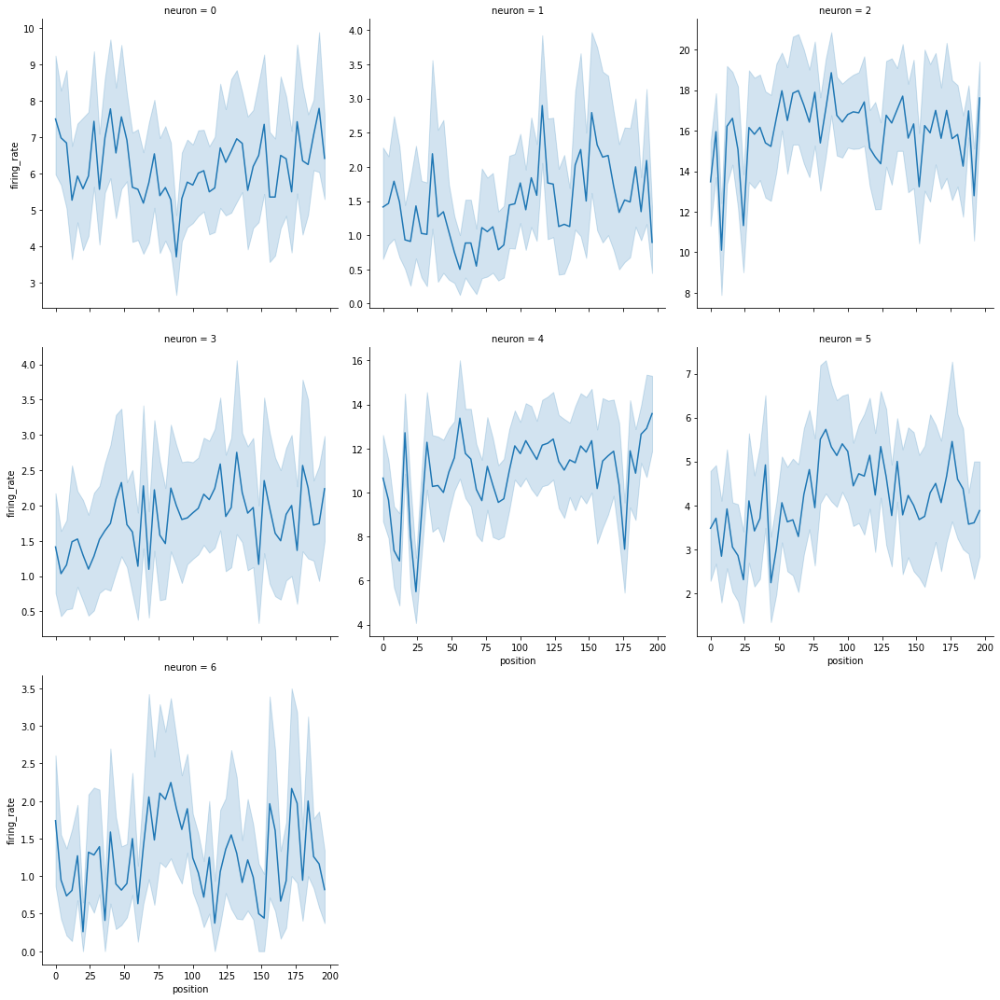

In [140]:
# calculate tuning curve

df_online_tc = makeTuningDataframe(position,spk_train.T,time_bin)

sns.relplot(x='position',y='firing_rate',col='neuron',col_wrap=3, kind="line",
    facet_kws = {'sharey':False},data=df_online_tc)


R[write to console]: `geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'



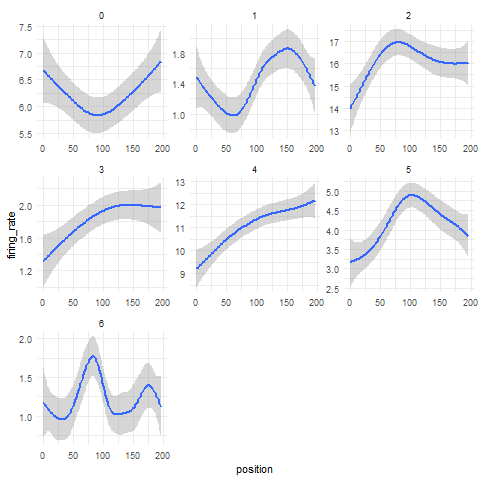

In [141]:
%%R -i df_online_tc
ggplot(df_online_tc) +
    geom_smooth(aes(x=position,y=firing_rate)) +
    facet_wrap(~neuron,scale='free') +
    theme_minimal()
# ggsave('online_tuningcurve.pdf')

## Offline sorting using spike interface

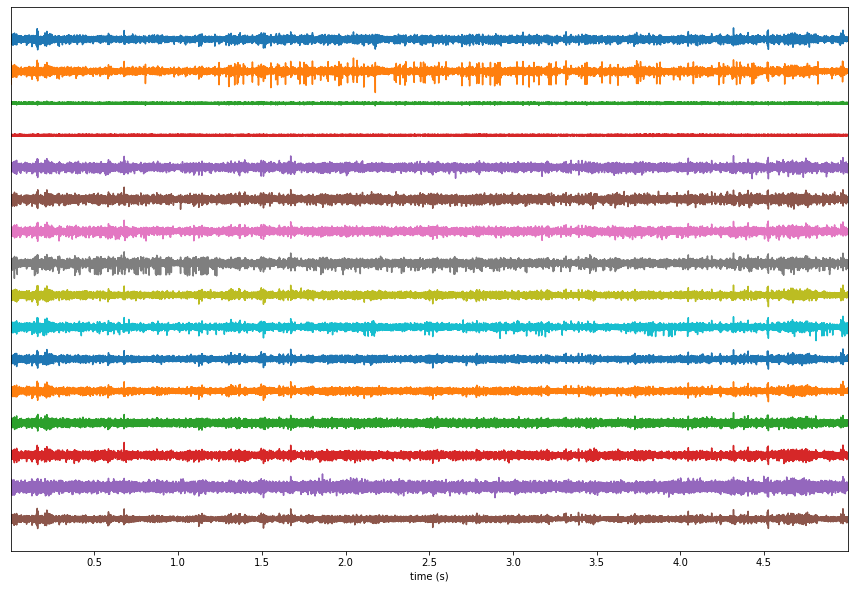

In [142]:
neuroData = adc_data[:16,:]
recording = se.NumpyRecordingExtractor(timeseries=neuroData,sampling_frequency=Fs)
recording.load_probe_file('tetrode_16.prb')
recording_f = st.preprocessing.bandpass_filter(recording, freq_min=300, freq_max=6000)
fig,ax = plt.subplots(figsize=(15,10))
sw.plot_timeseries(recording_f,trange=[0,5],ax=ax);

In [143]:
 #required for mountasort to store intermediate data
%env TEMPDIR=C:\tmp
ms4_params = ss.get_default_params('mountainsort4')
ms4_params['curation']=True
ms4_params['adjust_radius']  = 100
sorting_MS4_2 = ss.run_mountainsort4(recording=recording,output_folder='sorting_tmp',verbose=True)

env: TEMPDIR=C:\tmp
WARNING! No channel location given. Add dummy location.
Using 2 workers.
Using tmpdir: C:\tmp\tmp6fpmdcde
Num. workers = 2
Preparing C:\tmp\tmp6fpmdcde/timeseries.hdf5...
'end_frame' set to 13849600
Preparing neighborhood sorters (M=16, N=13849600)...
Preparing output...
Done with ms4alg.
Cleaning tmpdir::::: C:\tmp\tmp6fpmdcde
mountainsort4 run time 145.57s


In [144]:
# curation
sorting_ms4_curated = st.curation.threshold_snrs(sorting=sorting_MS4_2, recording = recording,
  threshold = 4, threshold_sign='less',
    max_snr_spikes_per_unit=100, apply_filter=False) #remove when less than threshold
print(sorting_ms4_curated.get_unit_ids())

sorting_ms4_curated=st.curation.threshold_firing_rates(sorting_ms4_curated,
    threshold=0.5, threshold_sign='less', duration_in_frames=recording.get_num_frames())
print(sorting_ms4_curated.get_unit_ids())

sorting_ms4_curated=st.curation.threshold_isi_violations(sorting_ms4_curated, 
    threshold = 0.9,duration_in_frames=recording.get_num_frames(), threshold_sign='greater' )
print(sorting_ms4_curated.get_unit_ids())


Impossible to delete temp file: C:\Users\teristam\AppData\Local\Temp\tmpbjb6p_g6 Error [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\teristam\\AppData\\Local\\Temp\\tmpbjb6p_g6\\waveforms_1.raw'
[2, 4, 8, 9, 10, 12, 14, 15, 17, 20, 22, 23, 26, 27]
[2, 4, 8, 9, 10, 12, 14, 15, 17, 20, 22, 23, 26, 27]
[2, 4, 8, 9, 10, 12, 14, 15, 17, 20, 22, 23, 26, 27]


In [145]:
time_bin_start = 0
bins = np.arange(time_bin_start, adc_data.shape[1]/Fs, time_bin )

# extract the spike train, and bin it in time
spiketrain = []
for i in sorting_ms4_curated.get_unit_ids():
    spk_train = sorting_ms4_curated.get_unit_spike_train(i)
    spk_train = (spk_train - start_timestamp)/Fs #convert to s
    spiketrain.append(np.histogram(spk_train,bins)[0])

spiketrain=np.stack(spiketrain)    

# make frame for plotting
df_ms4 = makeTuningDataframe(position, spiketrain.T,time_bin)


R[write to console]: `geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'



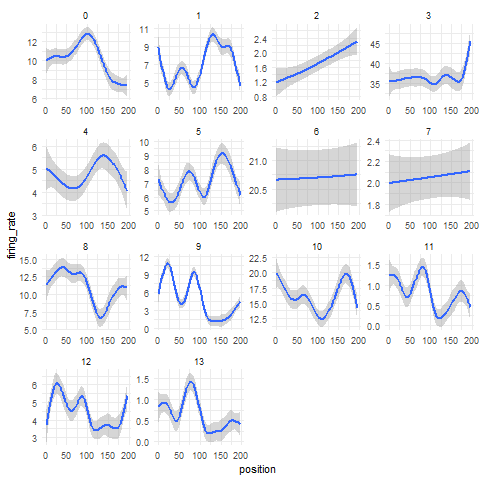

In [146]:
%%R -i df_ms4
options(repr.plot.width=12, repr.plot.height=8)

ggplot(df_ms4) +
    geom_smooth(aes(x=position,y=firing_rate)) +
    facet_wrap(~neuron,scale='free') +
    theme_minimal()
    
# ggsave('ms4_tuningcurve.pdf')